# Fundamentals

I'm going to start my reinforcement learning journey with the simplest possible example, since I don't have a good enough understanding of everything to do anything more complicated. After going through [these lectures](https://www.youtube.com/watch?v=2pWv7GOvuf0&list=PLzuuYNsE1EZAXYR4FJ75jcJseBmo4KQ9-), I left pretty confused overall. I mostly didn't understand what my confusion was, so I decided to watch another lecture to get a different perspective. I found [this lecture](https://www.youtube.com/watch?v=RtxI449ZjSc&feature=relmfu) by Andrew Ng and left less confused about the fundamentals. Ok, so if you've watched all of those lectures, you're exactly where I am. I'll try to explain any other existing relevant knowledge I have as it comes up. For now, since I'll assume we're starting from the same place. If you watched some other lecture series and haven't applied your knowledge yet, we're probably close enough so you might not need to watch the exact series.

## Grid World

Both Andrew Ng and David Silver seem to think Grid World is a good example for some reason, so might as well start with that. If you're wondering when we're going to start controling more complicated systems don't worry, we'll get there. For now we're going to go through the whole process of designing a world and implementing RL algorithms inside of it. I'm going to try not using libraries like Tensorflow since they typically abstract alot of the details. 

Ok, so let's get started.

### What is Grid World?

Grid world is a nice Markov Decision Process to play with. Hopefully after the lectures, you **think** you have a pretty good idea of what a Markov Decision Process (MDP) is. A MDP means that for every state we're in, there are other states we can get to from that state with some probability. We can influence what state we end up in by choosing from some set of actions. In grid world, our state is simply what position we are in. Our actions in each state are moving up, down, left or right. Formally, a MDP is a 4 tuple (S, A, P<sub>a</sub>, R<sub>a</sub>). Now P<sub>a</sub> is something that describes the environment, or how to go from one state to another, given all possible actions in the environment. 

So I'm roughly sure that P<sub>a</sub> can be represented by some matrix, but I'm not really sure how to do that. So Exercise 1 is make P<sub>a</sub> from a description of grid world.





## Exercise 1 -- Build P<sub>a</sub>, S and A

I'm just going to copy Andrew Ng's grid world exactly, so that I can check my answers since I don't know if I'm doing things correctly.

### Grid world description: 

The grid rewards looks like the following, where X is not allowed:
```
   _______________________ 
  |     |     |     |     |
3 |  0  |  0  |  0  |  1  |
  |_____|_____|_____|_____|
  |     |     |     |     |
2 |  0  |  X  |  0  | -1  |
  |_____|_____|_____|_____|
  |     |     |     |     |
1 |  0  |  0  |  0  |  0  |
  |_____|_____|_____|_____|
     1     2     3     4
```

Additionally, there is a -0.02 cost given to all actions. 

Actions are N, S, E, W (North, South, East, West). Andrew Ng specifies that the state transition probabilities given any action are:

0.8 : Probatility of going in the direction you choose
0.1 : Probability of going left instead (where forward is the direction you're trying to go)
0.1 : Probability of going right instead. 

And I think that P<sub>a</sub> is some matrix so when you multipy it by the state-action vector you get the next state. I'm not really sure how actions fit in there actually, but I'm going to try to make one anyways. I'll be using Numpy to work with matrices, but you can use whatever you want (list of lists, etc.).


In [24]:
import numpy as np

# Ok, so I can't just make a matrix that looks like the grid. Maybe if I make the grid a list of states, then things will make more sense.
# For clarification, Andrew Ng indexes column row, so (4,1) would be the bottom right grid square

S = [[1,3], [2,3], [3,3], [4,3],
     [1,2],        [3,2], [4,2],
     [1,1], [2,1], [3,1], [4,1]]
# Hmm, so I had to skip the state we're not allowed in since it's not a valid state. 
# That's a bit annoying, and doesn't allow me to specify the grid world in a natural way. 
# Later on I'll make a way to convert binary masks into a series of states, and make transisitons
# automatically. For now I think it's ok. 

S = np.asarray(S)
S



array([[1, 3],
       [2, 3],
       [3, 3],
       [4, 3],
       [1, 2],
       [3, 2],
       [4, 2],
       [1, 1],
       [2, 1],
       [3, 1],
       [4, 1]])

In [25]:
# Now we have all of our states. Now we need to say for each state, given some action, how does the state change? 

# Actually, I think I need a Reward matrix too. 

R = np.asarray(
    [-0.02,-0.02,-0.02, 1,
     -0.02,      -0.02,-1,
     -0.02,-0.02,-0.02,-0.02])
# Notice how I skipped the square we're not allowed in.

A = ['N', 'S', 'E', 'W']

P_a = []

for s in S:
    for a in A:
        P_a.append([[s,a], "some probabilites of transitioning somewhere else"])

P_a

[[[array([1, 3]), 'N'], 'some probabilites of transitioning somewhere else'],
 [[array([1, 3]), 'S'], 'some probabilites of transitioning somewhere else'],
 [[array([1, 3]), 'E'], 'some probabilites of transitioning somewhere else'],
 [[array([1, 3]), 'W'], 'some probabilites of transitioning somewhere else'],
 [[array([2, 3]), 'N'], 'some probabilites of transitioning somewhere else'],
 [[array([2, 3]), 'S'], 'some probabilites of transitioning somewhere else'],
 [[array([2, 3]), 'E'], 'some probabilites of transitioning somewhere else'],
 [[array([2, 3]), 'W'], 'some probabilites of transitioning somewhere else'],
 [[array([3, 3]), 'N'], 'some probabilites of transitioning somewhere else'],
 [[array([3, 3]), 'S'], 'some probabilites of transitioning somewhere else'],
 [[array([3, 3]), 'E'], 'some probabilites of transitioning somewhere else'],
 [[array([3, 3]), 'W'], 'some probabilites of transitioning somewhere else'],
 [[array([4, 3]), 'N'], 'some probabilites of transitioning some

Now I think I'm almost there. I just need to figure out how to represent the probabilities of transitioning 
to other states. I quickly reviewed David Silvers slides, and found [in these](https://www.davidsilver.uk/wp-content/uploads/2020/03/MDP.pdf) that it's natural to represent a State transition matrix P as the following (where there are n states, and Pab is the probability of transitioning from state a to state b):

```
            to
      _____________
     |P11  ...  P1n|
     |.            |
from |.            |
     |.            |
     |Pn1  ...  Pnn|
     |_____________|
```

We're not trying to make a state transition matrix, but a state action transition matrix. So since we're going from State + Action -> State. One thought is to make P for every a in A. So that means we'll have one state transition matrix for going North, one for South, one for East and one for West. This is pretty unsatisfactory in my mind. I'm going to go over the goal again and see if I can come up with some better representation of P<sub>a</sub>

## Goal Review

We want to eventually solve for the value of every state. So that means we need to be able to, for each state and action pair, calculate the distribution of ending up in other states. I think that's all we really need the matrix for. 

In that case, I think that having a matrix P<sub>a</sub> for every a in A is just fine. We'll just make it a NxNxA matrix and pretend that it's a good representation. 

In [26]:
# I'm going to make a NxNxA matrix now by first making P for every action (N,S,E,W) and then combining them. 
# I'm going to use the above format to describe transitions (the one with P11 to Pnn). 
# Remember the order of states is given by S (that's the same order the rows and columns of P will be in)

# Also I'm sure I could make some way to automatically make these transition matrices, but that's not the 
# point right now. It doesn't take long to fill them out manually, so I'm just going to do that. 

#    _______________________ 
#   |     |     |     |     |
# 3 |  0  |  0  |  0  |  1  |
#   |_____|_____|_____|_____|
#   |     |     |     |     |
# 2 |  0  |  X  |  0  | -1  |
#   |_____|_____|_____|_____|
#   |     |     |     |     |
# 1 |  0  |  0  |  0  |  0  |
#   |_____|_____|_____|_____|
#      1     2     3     4

# Transition probability of going north
P_n = np.asarray([
 # to
 #   1,3 2,3 3,3 4,3 1,2 3,2 4,2 1,1 2,1 3,1 4,1   
    [0, .8,  0,  0,  0,  0,  0,  0,  0,  0,  0],   # 1,3
    [0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],   # 2,3
    [0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],   # 3,3
    [0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],   # 4,3
    [0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],   # 1,2
    [0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],   # 3,2
    [0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],   # 4,2
    [0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],   # 1,1
    [0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],   # 2,1
    [0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],   # 3,1
    [0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0]    # 4,1
])




In [27]:
# Just kidding, this is taking forever. I'm making a function to generate these. 

# This is a binary representation of reachable states
world  = np.asarray([
    [1, 1, 1, 1],
    [1, 0, 1, 1],
    [1, 1, 1, 1]
])

N = np.count_nonzero(world)
P_a = np.zeros((N, N, len(A)))

In [28]:
# Represent action spce A (N, S, E, W) with vectors since it's easier to compute with these
# Note that north is -1 since rows go down. Also notice that x and y are switched since matrices
# are indexed [row, col] (y, x). 
A = np.asarray([
    [-1,0], # N
    [1,0],  # S
    [0,1],  # E
    [0,-1]  # W
])

# While we're at it, I'm really annoyed at the column-row notation, and the indexing from 1. We're
# just going to define S with indices into the world marix
S = np.argwhere(world > 0)

# Define the probability of going the desired direction as a vector for Forward, Right, Left respectively
P_dir = [.8, .1, .1]

# Let's now fill out the state transition matrix
for i, a in enumerate(A):
    for j, s in enumerate(S):
        # The "right" and "left" directions are just the direction vectors
        # rotated to the right and left 90 degrees. 
        a_right = np.matmul(np.asarray([[0,-1],[1,0]]), a)
        a_left =  np.matmul(np.asarray([[0,1],[-1,0]]), a)
        
        # Note that if the new state exists, then the length will be 1, else 0
        new_s_a = np.where((S == s + a).all(axis=1))[0]
        new_s_a_right = np.where((S == s + a_right).all(axis=1))[0]
        new_s_a_left = np.where((S == s + a_left).all(axis=1))[0]
        
        # Make sure everything is still 0 (for example if you run this cell multiple times)
        P_a[j,:,i] = 0 
        for k, s_p in enumerate([new_s_a, new_s_a_right, new_s_a_left]):
            if len(s_p) == 1:
                P_a[j, s_p[0], i] = P_dir[k]
            else: 
                P_a[j, j, i] += P_dir[k]

# That was confusing to write. But we're done!

# Review what happened

I made P_a, which is a NxNxA matrix with the state transition probabilities for any action. Now it's time to use it to produce our value function. We want to figure out how valuable each state is. This means we need to calculate what the expected discounted reward is for every state.

This can be formalized with Bellman's Equations, saying each state's reward is just the immediate reward plus the discounted future reward. Unfortunately, the discounted future reward seems to be dependent on our actions. 

So to fix that, I'll just assume that we iterate through all possible actions for each step and choose which action results in the most discounted future reward. 

# Exercise 2 -- Calculate the value function of Grid World

Given the grid world described above, figure out what the value of each square is. Assume some discount factor gamma as a variable. 

In [85]:
# If I remember from the lectures correctly, there are two main ways to calculate 
# the value funciton. You either synchronously update the value function, or asynchronously. 
# I'll just synchronously update them for now.

def display_value_function(V, msg=""):
    res = """
   _______________________ 
  |     |     |     |     |
3 |{:5.2f}|{:5.2f}|{:5.2f}|{:5.2f}|
  |_____|_____|_____|_____|
  |     |     |     |     |
2 |{:5.2f}|  X  |{:5.2f}|{:5.2f}|
  |_____|_____|_____|_____|
  |     |     |     |     |
1 |{:5.2f}|{:5.2f}|{:5.2f}|{:5.2f}|
  |_____|_____|_____|_____|
     1     2     3     4
    """.format(*V)
    print(msg)
    print(res)


In [94]:
# This is just a guess at the gamma that Andrew Ng used. It seems correct.
def get_value_function(R, P_a, A, gamma=0.99):
    V = np.copy(R)
    
    all_Vs = []
    while True:
        V_now = np.copy(V)
        all_Vs.append(V_now)
        for i, v in enumerate(V):
            # print(v)
            actionValues = []
            if (R[i] == 1 or R[i] == -1):
                V[i] = R[i]
            else:
                for j, a in enumerate(A):
                    # Multiply the probability of action times the value of the action times the discount
                    # Add the results for the total expected value of that 
                    E_a = np.sum(gamma * P_a[i, :, j] * V_now)
                    actionValues.append(E_a)
                V[i] = R[i] + np.max(actionValues)
            
        if (np.allclose(V_now, V)):
            break
        else:
            V_now = V
            # display_value_function(V)
    return V, all_Vs
display_value_function(V, "Initial Value:")
V, all_Vs = get_value_function(R, P_a, A)
display_value_function(V, "Final Value: ")

Initial Value:

   _______________________ 
  |     |     |     |     |
3 | 0.86| 0.90| 0.93| 1.00|
  |_____|_____|_____|_____|
  |     |     |     |     |
2 | 0.82|  X  | 0.69|-1.00|
  |_____|_____|_____|_____|
  |     |     |     |     |
1 | 0.78| 0.75| 0.71| 0.49|
  |_____|_____|_____|_____|
     1     2     3     4
    
Final Value: 

   _______________________ 
  |     |     |     |     |
3 | 0.86| 0.90| 0.93| 1.00|
  |_____|_____|_____|_____|
  |     |     |     |     |
2 | 0.82|  X  | 0.69|-1.00|
  |_____|_____|_____|_____|
  |     |     |     |     |
1 | 0.78| 0.75| 0.71| 0.49|
  |_____|_____|_____|_____|
     1     2     3     4
    


# Exercise 3 -- Calculate the optimal policy from the value function

This is pretty straight forward. Simply take the action which results in the maximum value.

In [54]:
def display_policy_function(P, msg=""):
    P_disp = []
    for i, p in enumerate(P):
        if (np.allclose(p, A[0])):
            P_disp.append("^")
        if (np.allclose(p, A[1])):
            P_disp.append("v")
        if (np.allclose(p, A[2])):
            P_disp.append(">")
        if (np.allclose(p, A[3])):
            P_disp.append("<")
        if (np.allclose(p, [0,0])):
            P_disp.append("*")
    res = """
   _______________________ 
  |     |     |     |     |
3 |  {}  |  {}  |  {}  |  {}  |
  |_____|_____|_____|_____|
  |     |     |     |     |
2 |  {}  |  X  |  {}  |  {}  |
  |_____|_____|_____|_____|
  |     |     |     |     |
1 |  {}  |  {}  |  {}  |  {}  |
  |_____|_____|_____|_____|
     1     2     3     4
    """.format(*P_disp)
    print(msg)
    print(res)


def get_policy(V):
    P = []
    for i, v in enumerate(V):
        actionValues = []
        if (R[i] == 1 or R[i] == -1):
            P.append([0,0])
        else:
            for j, a in enumerate(A):
                # This is mostly identical to before. 
                E_a = np.sum(gamma * P_a[i, :, j] * V)
                actionValues.append(E_a)
            max_a =  np.argmax(actionValues)
            P.append(A[max_a])
    return P

P = get_policy(V)
display_policy_function(P)



   _______________________ 
  |     |     |     |     |
3 |  >  |  >  |  >  |  *  |
  |_____|_____|_____|_____|
  |     |     |     |     |
2 |  ^  |  X  |  ^  |  *  |
  |_____|_____|_____|_____|
  |     |     |     |     |
1 |  ^  |  <  |  <  |  <  |
  |_____|_____|_____|_____|
     1     2     3     4
    


# Plotting Results

I've made an optimal policy for Grid World, so I'll call that exercise complete. Now I'm going to try to make some nice plots to shed some intuition on what happened.

# Value Iteration Plot

I was really confused about the term "Bellman Backups" for a while, and didn't really get what was "backing up". After implementing this, I think I understand now. It refers to how the value iteration function converges by taking the goal value and propogating the information backwards every iteration step. I'm going to demonstrate how this works by using an animated 3d bar chart! I recomend that you move the slider by hand to see what's happening every iteration step.  

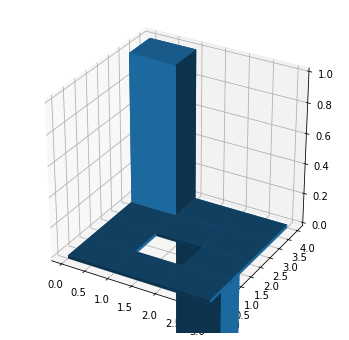

In [88]:
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
plt.rcParams["animation.html"] = "jshtml"
import matplotlib.animation

fig = plt.figure(figsize=(6, 6))
ax1 = fig.add_subplot(111, projection='3d')

t = range(len(all_Vs))
bottom = np.zeros_like(all_Vs[0])
width = depth = 1

def draw_plt(iteration):
    ax1.cla()
    ax1.bar3d(S[:,0], S[:,1], bottom, width, depth, all_Vs[iteration], shade=True)

ax1.set_title('Shaded')

ani = mpl.animation.FuncAnimation(fig, draw_plt, frames=len(t))
ani

# Comparing Synchronous vs. Asynchronous Updates

Forgive me for copy and pasting code, but I want to modify the synchronous update value iteration to update asynchronously, so I can plot the difference. 

In [92]:
V = np.copy(R)
display_value_function(V, "Initial Value:")
all_Vs_async = []
while True:
    V_now = np.copy(V)
    for i, v in enumerate(V):
        # print(v)
        actionValues = []
        if (R[i] == 1 or R[i] == -1):
            V[i] = R[i]
        else:
            for j, a in enumerate(A):
                # Multiply the probability of action times the value of the action times the discount
                # Add the results for the total expected value of that 
                E_a = np.sum(gamma * P_a[i, :, j] * V_now)
                actionValues.append(E_a)
            V[i] = R[i] + np.max(actionValues)
            all_Vs_async.append(np.copy(V))
    if (np.allclose(V_now, V)):
        break
display_value_function(all_Vs_async[-1])

Initial Value:

   _______________________ 
  |     |     |     |     |
3 |-0.02|-0.02|-0.02| 1.00|
  |_____|_____|_____|_____|
  |     |     |     |     |
2 |-0.02|  X  |-0.02|-1.00|
  |_____|_____|_____|_____|
  |     |     |     |     |
1 |-0.02|-0.02|-0.02|-0.02|
  |_____|_____|_____|_____|
     1     2     3     4
    


   _______________________ 
  |     |     |     |     |
3 | 0.86| 0.90| 0.93| 1.00|
  |_____|_____|_____|_____|
  |     |     |     |     |
2 | 0.82|  X  | 0.69|-1.00|
  |_____|_____|_____|_____|
  |     |     |     |     |
1 | 0.78| 0.75| 0.71| 0.49|
  |_____|_____|_____|_____|
     1     2     3     4
    


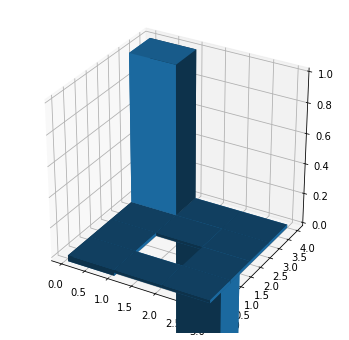

In [93]:
fig = plt.figure(figsize=(6, 6))
ax1 = fig.add_subplot(111, projection='3d')

t = range(len(all_Vs_async))
bottom = np.zeros_like(all_Vs_async[0])
width = depth = 1

def draw_plt(iteration):
    ax1.cla()
    ax1.bar3d(S[:,0], S[:,1], bottom, width, depth, all_Vs_async[iteration], shade=True)

ax1.set_title('Shaded')

ani = mpl.animation.FuncAnimation(fig, draw_plt, frames=len(t))
ani

# Observations

That's pretty cool! They both converge to the same value, but we can see how the asynchronous update function incrementally updates the value function instead of doing it in batches. Not sure how this knowledge is applicable to anything, but it's pretty neat. Now I want to see what the affect of the choice of some parameters are on the solution we get. First I'm going to explore changes in gamma on the resulting solution space, because I noticed when I was trying to guess what gamma value Andrew Ng used, the gamma value actually affected the optimal policy. 

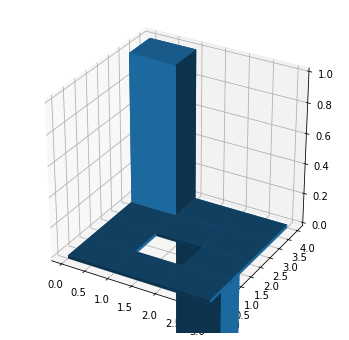

In [96]:
fig = plt.figure(figsize=(6, 6))
ax1 = fig.add_subplot(111, projection='3d')

all_Vs_gamma = []
for gamma_test in np.linspace(0, 1):
    V_gamma, _ = get_value_function(R, P_a, A, gamma_test)
    all_Vs_gamma.append(V_gamma)

t = range(len(all_Vs_gamma))
bottom = np.zeros_like(all_Vs_gamma[0])
width = depth = 1

def draw_plt(iteration):
    ax1.cla()
    ax1.bar3d(S[:,0], S[:,1], bottom, width, depth, all_Vs_gamma[iteration], shade=True)

ax1.set_title('Shaded')

ani = mpl.animation.FuncAnimation(fig, draw_plt, frames=len(t))
ani

# Conclusions

That was pretty helpful. I definitely learned alot about how the Bellman equation actually works, and why it's intuitive. Some of the plots weren't strictly necessary (I can't put my finger on a specific thing I learned from iterating gamma), but it was still really cool to see the results of playing with the different variants of this algorithm. 

Time to move on to the next RL goal! 